In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
pd.set_option("Display.max_row" , None)

# This Uber data 
Belong to passenger of uber that face issue of cancelation of booking , car not availeble , pick up & drop time

In [3]:
df = pd.read_csv("J:\\Learn Data Science\\Case Study\\Uber\\Uber Request Data.csv")
df.head(10)

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp
0,619,Airport,1.0,Trip Completed,11/7/2016 11:51,11/7/2016 13:00
1,867,Airport,1.0,Trip Completed,11/7/2016 17:57,11/7/2016 18:47
2,1807,City,1.0,Trip Completed,12/7/2016 9:17,12/7/2016 9:58
3,2532,Airport,1.0,Trip Completed,12/7/2016 21:08,12/7/2016 22:03
4,3112,City,1.0,Trip Completed,13-07-2016 08:33:16,13-07-2016 09:25:47
5,3879,Airport,1.0,Trip Completed,13-07-2016 21:57:28,13-07-2016 22:28:59
6,4270,Airport,1.0,Trip Completed,14-07-2016 06:15:32,14-07-2016 07:13:15
7,5510,Airport,1.0,Trip Completed,15-07-2016 05:11:52,15-07-2016 06:07:52
8,6248,City,1.0,Trip Completed,15-07-2016 17:57:27,15-07-2016 18:50:51
9,267,City,2.0,Trip Completed,11/7/2016 6:46,11/7/2016 7:25


In [4]:
df.shape

(6745, 6)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6745 entries, 0 to 6744
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Request id         6745 non-null   int64  
 1   Pickup point       6745 non-null   object 
 2   Driver id          4095 non-null   float64
 3   Status             6745 non-null   object 
 4   Request timestamp  6745 non-null   object 
 5   Drop timestamp     2831 non-null   object 
dtypes: float64(1), int64(1), object(4)
memory usage: 316.3+ KB


In [6]:
df.isnull().sum()

Request id              0
Pickup point            0
Driver id            2650
Status                  0
Request timestamp       0
Drop timestamp       3914
dtype: int64

In [7]:
df.isnull().sum() / df.shape[0]*100

Request id            0.000000
Pickup point          0.000000
Driver id            39.288362
Status                0.000000
Request timestamp     0.000000
Drop timestamp       58.028169
dtype: float64

# First Task is Make date time format of ' Request timestamp & Drop timestamp '


In [8]:
df['Request timestamp'].value_counts().head(15)

11/7/2016 9:40     6
11/7/2016 19:02    6
11/7/2016 17:57    6
11/7/2016 8:37     6
11/7/2016 20:47    5
11/7/2016 19:01    5
11/7/2016 9:24     5
11/7/2016 21:38    5
12/7/2016 4:46     5
12/7/2016 21:07    5
12/7/2016 17:30    5
12/7/2016 19:17    5
12/7/2016 19:31    5
11/7/2016 19:14    5
12/7/2016 21:42    5
Name: Request timestamp, dtype: int64

In [9]:
df['Request timestamp'] = df['Request timestamp'].astype(str)    # Changing to string

In [10]:
df['Request timestamp'] = df['Request timestamp'].replace("/" , "-")   # Replaceing '/' to '-'

In [11]:
df['Request timestamp'] =pd.to_datetime(df['Request timestamp'] , dayfirst= True)   # Making datetime format

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6745 entries, 0 to 6744
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Request id         6745 non-null   int64         
 1   Pickup point       6745 non-null   object        
 2   Driver id          4095 non-null   float64       
 3   Status             6745 non-null   object        
 4   Request timestamp  6745 non-null   datetime64[ns]
 5   Drop timestamp     2831 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(1), object(3)
memory usage: 316.3+ KB


In [13]:
df['Drop timestamp'].value_counts()

11/7/2016 13:00        4
12/7/2016 21:04        4
12/7/2016 6:22         4
12/7/2016 21:53        4
12/7/2016 19:14        3
12/7/2016 10:58        3
11/7/2016 7:54         3
12/7/2016 6:02         3
12/7/2016 22:51        3
12/7/2016 7:42         3
12/7/2016 21:35        3
12/7/2016 9:58         3
11/7/2016 10:55        3
11/7/2016 8:44         3
12/7/2016 18:30        3
11/7/2016 13:10        3
12/7/2016 13:01        3
11/7/2016 7:10         3
11/7/2016 18:39        3
11/7/2016 23:45        3
11/7/2016 10:10        3
12/7/2016 11:32        3
11/7/2016 8:55         3
12/7/2016 12:13        3
11/7/2016 21:18        3
12/7/2016 8:45         3
11/7/2016 7:50         3
11/7/2016 17:35        2
12/7/2016 16:47        2
12/7/2016 15:09        2
11/7/2016 18:47        2
11/7/2016 8:10         2
12/7/2016 10:30        2
12/7/2016 22:56        2
12/7/2016 15:06        2
11/7/2016 10:05        2
11/7/2016 22:56        2
12/7/2016 2:18         2
12/7/2016 19:49        2
11/7/2016 23:52        2


In [14]:
# Let's make Drop timestamp also datetime format

df['Drop timestamp'] = pd.to_datetime(df['Drop timestamp'] , dayfirst = True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6745 entries, 0 to 6744
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Request id         6745 non-null   int64         
 1   Pickup point       6745 non-null   object        
 2   Driver id          4095 non-null   float64       
 3   Status             6745 non-null   object        
 4   Request timestamp  6745 non-null   datetime64[ns]
 5   Drop timestamp     2831 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), int64(1), object(2)
memory usage: 316.3+ KB


In [16]:
req_hour = df['Request timestamp'].dt.hour    # Reuest_time is in req_Hour varible

In [17]:
len(req_hour)

6745

In [18]:
df['req_hour']=req_hour

In [19]:
req_day = df['Request timestamp'].dt.day

In [20]:
df['req_day'] = req_day

In [21]:
df.head(10)

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day
0,619,Airport,1.0,Trip Completed,2016-07-11 11:51:00,2016-07-11 13:00:00,11,11
1,867,Airport,1.0,Trip Completed,2016-07-11 17:57:00,2016-07-11 18:47:00,17,11
2,1807,City,1.0,Trip Completed,2016-07-12 09:17:00,2016-07-12 09:58:00,9,12
3,2532,Airport,1.0,Trip Completed,2016-07-12 21:08:00,2016-07-12 22:03:00,21,12
4,3112,City,1.0,Trip Completed,2016-07-13 08:33:16,2016-07-13 09:25:47,8,13
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14
7,5510,Airport,1.0,Trip Completed,2016-07-15 05:11:52,2016-07-15 06:07:52,5,15
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11


In [22]:
df.loc[df['req_hour']]

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day
11,1983,City,2.0,Trip Completed,2016-07-12 12:30:00,2016-07-12 12:57:00,12,12
17,5335,Airport,2.0,Trip Completed,2016-07-14 22:24:13,2016-07-14 23:18:52,22,14
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11
21,2083,Airport,3.0,Trip Completed,2016-07-12 15:46:00,2016-07-12 16:40:00,15,12
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15
21,2083,Airport,3.0,Trip Completed,2016-07-12 15:46:00,2016-07-12 16:40:00,15,12
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13
17,5335,Airport,2.0,Trip Completed,2016-07-14 22:24:13,2016-07-14 23:18:52,22,14
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14


In [23]:
plt.figure(figsize = (13,8))
sns.countplot(x = req_hour , data = df, hue = 'Status')
plt.show()

In [24]:
sns.lineplot(x = 'req_day' , y = 'req_hour', data = df , hue = "Status" )
plt.show()

In [25]:
# Let's Make time slot columns in df data set

df['Time_slot']= 0
df

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
0,619,Airport,1.0,Trip Completed,2016-07-11 11:51:00,2016-07-11 13:00:00,11,11,0
1,867,Airport,1.0,Trip Completed,2016-07-11 17:57:00,2016-07-11 18:47:00,17,11,0
2,1807,City,1.0,Trip Completed,2016-07-12 09:17:00,2016-07-12 09:58:00,9,12,0
3,2532,Airport,1.0,Trip Completed,2016-07-12 21:08:00,2016-07-12 22:03:00,21,12,0
4,3112,City,1.0,Trip Completed,2016-07-13 08:33:16,2016-07-13 09:25:47,8,13,0
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13,0
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14,0
7,5510,Airport,1.0,Trip Completed,2016-07-15 05:11:52,2016-07-15 06:07:52,5,15,0
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15,0
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11,0


# According to 'req_hour' let's schedule by 'Time_slot'

In [41]:
# For that we are using For loop

# Below For loop ashya pramane Kam kart ahe ki 
# To adhi 'req_hour' chya column madhe janar tyayt '0' row & '6' column chi value check karnar
# jar if chya condition pramane satisfy zalya var , loop madhun baher padun 'j' means '0' chi value incease honar
# Ani as saglya row sathi honar

In [50]:
j = 0 
for i in df['req_hour'] :
    if df.iloc[j,6]<5:
        df.iloc[j,8] = "Pre_Morning"
    elif 5<= df.iloc[j,6] < 10 :
        df.iloc[j,8] ="Morning_Rush"
    elif 10 <= df.iloc[j,6] < 17:
        df.iloc[j,8] = "Day_Time"
    elif 17<= df.iloc[j,6] <22 :
        df.iloc[j,8] = "Evening_Rush"
    else :
        df.iloc[j,8] = "Late_Night"
    j= j+1

In [51]:
df

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
0,619,Airport,1.0,Trip Completed,2016-07-11 11:51:00,2016-07-11 13:00:00,11,11,Day_Time
1,867,Airport,1.0,Trip Completed,2016-07-11 17:57:00,2016-07-11 18:47:00,17,11,Evening_Rush
2,1807,City,1.0,Trip Completed,2016-07-12 09:17:00,2016-07-12 09:58:00,9,12,Morning_Rush
3,2532,Airport,1.0,Trip Completed,2016-07-12 21:08:00,2016-07-12 22:03:00,21,12,Evening_Rush
4,3112,City,1.0,Trip Completed,2016-07-13 08:33:16,2016-07-13 09:25:47,8,13,Morning_Rush
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13,Evening_Rush
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14,Morning_Rush
7,5510,Airport,1.0,Trip Completed,2016-07-15 05:11:52,2016-07-15 06:07:52,5,15,Morning_Rush
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15,Evening_Rush
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11,Morning_Rush


In [56]:
# Let's count the value of each category of 'Tiem_slot' column

df['Time_slot'].value_counts()

# df['Time_slot'].value_counts().sum()

Evening_Rush    2342
Morning_Rush    2103
Day_Time        1224
Pre_Morning      578
Late_Night       498
Name: Time_slot, dtype: int64

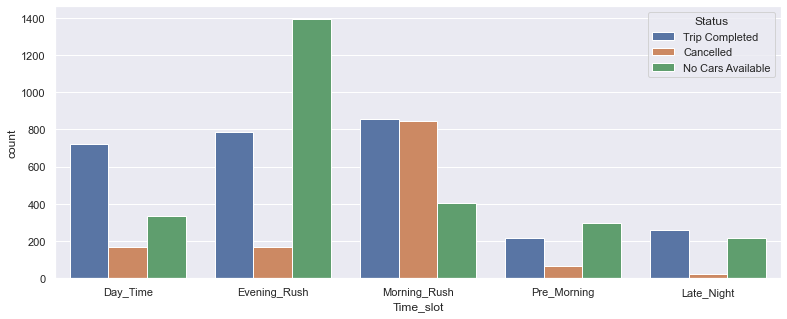

In [61]:
# Let's plot count plot
plt.figure(figsize = (13,5))
sns.set()
sns.countplot(x = "Time_slot" , data = df, hue = "Status")

plt.show()

In [72]:
df_Morning_Rush = df[df['Time_slot'] == "Morning_Rush"]
df_Morning_Rush

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2,1807,City,1.0,Trip Completed,2016-07-12 09:17:00,2016-07-12 09:58:00,9,12,Morning_Rush
4,3112,City,1.0,Trip Completed,2016-07-13 08:33:16,2016-07-13 09:25:47,8,13,Morning_Rush
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14,Morning_Rush
7,5510,Airport,1.0,Trip Completed,2016-07-15 05:11:52,2016-07-15 06:07:52,5,15,Morning_Rush
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11,Morning_Rush
10,1467,Airport,2.0,Trip Completed,2016-07-12 05:08:00,2016-07-12 06:02:00,5,12,Morning_Rush
13,3075,City,2.0,Trip Completed,2016-07-13 08:02:53,2016-07-13 09:16:19,8,13,Morning_Rush
23,3096,Airport,3.0,Trip Completed,2016-07-13 08:17:29,2016-07-13 09:22:37,8,13,Morning_Rush
29,1567,Airport,4.0,Trip Completed,2016-07-12 06:21:00,2016-07-12 07:10:00,6,12,Morning_Rush
30,1826,City,4.0,Trip Completed,2016-07-12 09:27:00,2016-07-12 10:27:00,9,12,Morning_Rush


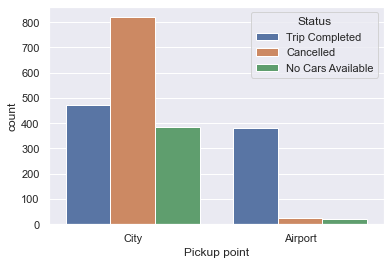

In [96]:
sns.countplot(x = 'Pickup point' , data = df_Morning_Rush , hue = "Status" )

#  Of cancellation of cab in morning rush

In [98]:
df_airport_cancelled = df_Morning_Rush.loc[(df_Morning_Rush['Pickup point'] == 'Airport') & (df_Morning_Rush['Status'] == "Cancelled")]

In [99]:
df_airport_cancelled

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2841,1867,Airport,3.0,Cancelled,2016-07-12 09:59:00,NaT,9,12,Morning_Rush
2909,1462,Airport,23.0,Cancelled,2016-07-12 05:01:00,NaT,5,12,Morning_Rush
2910,196,Airport,24.0,Cancelled,2016-07-11 06:07:00,NaT,6,11,Morning_Rush
2944,5847,Airport,31.0,Cancelled,2016-07-15 09:05:38,NaT,9,15,Morning_Rush
3130,2844,Airport,74.0,Cancelled,2016-07-13 05:28:12,NaT,5,13,Morning_Rush
3157,5806,Airport,81.0,Cancelled,2016-07-15 08:46:33,NaT,8,15,Morning_Rush
3202,3018,Airport,92.0,Cancelled,2016-07-13 07:27:44,NaT,7,13,Morning_Rush
3254,5854,Airport,103.0,Cancelled,2016-07-15 09:09:32,NaT,9,15,Morning_Rush
3315,174,Airport,119.0,Cancelled,2016-07-11 05:44:00,NaT,5,11,Morning_Rush
3349,1776,Airport,128.0,Cancelled,2016-07-12 09:02:00,NaT,9,12,Morning_Rush


In [100]:
df_city_cancelled = df_Morning_Rush.loc[(df_Morning_Rush['Pickup point'] == 'City') & (df_Morning_Rush['Status'] == "Cancelled")]

In [125]:
df_city_cancelled

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2831,2905,City,1.0,Cancelled,2016-07-13 06:08:41,NaT,6,13,Morning_Rush
2837,4451,City,2.0,Cancelled,2016-07-14 08:38:38,NaT,8,14,Morning_Rush
2842,4383,City,3.0,Cancelled,2016-07-14 07:48:31,NaT,7,14,Morning_Rush
2846,4280,City,4.0,Cancelled,2016-07-14 06:33:09,NaT,6,14,Morning_Rush
2847,4533,City,4.0,Cancelled,2016-07-14 09:31:08,NaT,9,14,Morning_Rush
2849,4296,City,5.0,Cancelled,2016-07-14 06:39:26,NaT,6,14,Morning_Rush
2850,3059,City,6.0,Cancelled,2016-07-13 07:56:25,NaT,7,13,Morning_Rush
2851,5547,City,6.0,Cancelled,2016-07-15 05:30:31,NaT,5,15,Morning_Rush
2852,5699,City,6.0,Cancelled,2016-07-15 07:25:53,NaT,7,15,Morning_Rush
2853,5701,City,6.0,Cancelled,2016-07-15 07:34:00,NaT,7,15,Morning_Rush


In [105]:
df_city_cancelled.shape[1]

9

# Now Let's check Supply & Demand in Morning Rush

In [106]:
df_Morning_Rush.loc[(df_Morning_Rush['Pickup point'] == "Airport") & (df_Morning_Rush['Status'] == "Trip Completed")]

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
6,4270,Airport,1.0,Trip Completed,2016-07-14 06:15:32,2016-07-14 07:13:15,6,14,Morning_Rush
7,5510,Airport,1.0,Trip Completed,2016-07-15 05:11:52,2016-07-15 06:07:52,5,15,Morning_Rush
10,1467,Airport,2.0,Trip Completed,2016-07-12 05:08:00,2016-07-12 06:02:00,5,12,Morning_Rush
23,3096,Airport,3.0,Trip Completed,2016-07-13 08:17:29,2016-07-13 09:22:37,8,13,Morning_Rush
29,1567,Airport,4.0,Trip Completed,2016-07-12 06:21:00,2016-07-12 07:10:00,6,12,Morning_Rush
32,2847,Airport,4.0,Trip Completed,2016-07-13 05:34:20,2016-07-13 06:09:59,5,13,Morning_Rush
36,5771,Airport,4.0,Trip Completed,2016-07-15 08:30:06,2016-07-15 09:37:20,8,15,Morning_Rush
41,1756,Airport,5.0,Trip Completed,2016-07-12 08:40:00,2016-07-12 09:23:00,8,12,Morning_Rush
47,5857,Airport,5.0,Trip Completed,2016-07-15 09:08:50,2016-07-15 10:07:07,9,15,Morning_Rush
49,1517,Airport,6.0,Trip Completed,2016-07-12 05:45:00,2016-07-12 06:28:00,5,12,Morning_Rush


In [107]:
df_Morning_Rush.loc[(df_Morning_Rush['Pickup point'] == "City") & (df_Morning_Rush['Status'] == "Trip Completed")]

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2,1807,City,1.0,Trip Completed,2016-07-12 09:17:00,2016-07-12 09:58:00,9,12,Morning_Rush
4,3112,City,1.0,Trip Completed,2016-07-13 08:33:16,2016-07-13 09:25:47,8,13,Morning_Rush
9,267,City,2.0,Trip Completed,2016-07-11 06:46:00,2016-07-11 07:25:00,6,11,Morning_Rush
13,3075,City,2.0,Trip Completed,2016-07-13 08:02:53,2016-07-13 09:16:19,8,13,Morning_Rush
30,1826,City,4.0,Trip Completed,2016-07-12 09:27:00,2016-07-12 10:27:00,9,12,Morning_Rush
38,312,City,5.0,Trip Completed,2016-07-11 07:27:00,2016-07-11 08:31:00,7,11,Morning_Rush
44,3014,City,5.0,Trip Completed,2016-07-13 07:28:14,2016-07-13 08:29:47,7,13,Morning_Rush
46,4297,City,5.0,Trip Completed,2016-07-14 06:43:01,2016-07-14 07:49:38,6,14,Morning_Rush
57,5741,City,6.0,Trip Completed,2016-07-15 07:52:51,2016-07-15 08:38:55,7,15,Morning_Rush
63,4509,City,7.0,Trip Completed,2016-07-14 09:11:13,2016-07-14 10:17:01,9,14,Morning_Rush


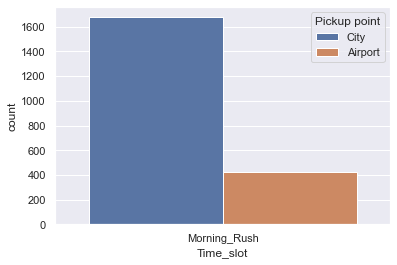

In [112]:
sns.countplot(x = 'Time_slot' , data = df_Morning_Rush , hue = "Pickup point" )
# sns.countplot(x = 'Time_slot' , data = df_Morning_Rush , hue = "Status" )

#  Cancelation of Cabs in evenings

In [117]:
df_eve_rush = df[df['Time_slot'] == "Evening_Rush"]

In [118]:
df_eve_rush

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
1,867,Airport,1.0,Trip Completed,2016-07-11 17:57:00,2016-07-11 18:47:00,17,11,Evening_Rush
3,2532,Airport,1.0,Trip Completed,2016-07-12 21:08:00,2016-07-12 22:03:00,21,12,Evening_Rush
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13,Evening_Rush
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15,Evening_Rush
15,3482,Airport,2.0,Trip Completed,2016-07-13 17:23:18,2016-07-13 18:20:51,17,13,Evening_Rush
19,960,Airport,3.0,Trip Completed,2016-07-11 18:45:00,2016-07-11 19:23:00,18,11,Evening_Rush
22,2211,Airport,3.0,Trip Completed,2016-07-12 18:00:00,2016-07-12 18:28:00,18,12,Evening_Rush
24,3881,Airport,3.0,Trip Completed,2016-07-13 21:54:18,2016-07-13 22:51:23,21,13,Evening_Rush
25,5254,City,3.0,Trip Completed,2016-07-14 21:23:03,2016-07-14 22:25:19,21,14,Evening_Rush
33,3722,Airport,4.0,Trip Completed,2016-07-13 19:57:59,2016-07-13 20:32:04,19,13,Evening_Rush


In [119]:
df_eve_rush.loc[df_eve_rush['Status'] == 'Cancelled']

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2832,4805,City,1.0,Cancelled,2016-07-14 17:07:58,NaT,17,14,Evening_Rush
2833,5202,Airport,1.0,Cancelled,2016-07-14 20:51:37,NaT,20,14,Evening_Rush
2835,2347,Airport,2.0,Cancelled,2016-07-12 19:14:00,NaT,19,12,Evening_Rush
2836,3806,Airport,2.0,Cancelled,2016-07-13 20:57:49,NaT,20,13,Evening_Rush
2838,5023,Airport,2.0,Cancelled,2016-07-14 19:04:08,NaT,19,14,Evening_Rush
2844,1254,Airport,4.0,Cancelled,2016-07-11 21:53:00,NaT,21,11,Evening_Rush
2845,3807,Airport,4.0,Cancelled,2016-07-13 20:58:00,NaT,20,13,Evening_Rush
2855,2582,Airport,7.0,Cancelled,2016-07-12 21:42:00,NaT,21,12,Evening_Rush
2864,3549,City,9.0,Cancelled,2016-07-13 18:03:30,NaT,18,13,Evening_Rush
2871,3499,City,13.0,Cancelled,2016-07-13 17:46:24,NaT,17,13,Evening_Rush


In [121]:
df_Airport_cancelled = df_eve_rush.loc[(df_eve_rush['Pickup point'] == 'Airport') & (df_eve_rush['Status'] == 'Cancelled')]

In [122]:
df_Airport_cancelled

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2833,5202,Airport,1.0,Cancelled,2016-07-14 20:51:37,NaT,20,14,Evening_Rush
2835,2347,Airport,2.0,Cancelled,2016-07-12 19:14:00,NaT,19,12,Evening_Rush
2836,3806,Airport,2.0,Cancelled,2016-07-13 20:57:49,NaT,20,13,Evening_Rush
2838,5023,Airport,2.0,Cancelled,2016-07-14 19:04:08,NaT,19,14,Evening_Rush
2844,1254,Airport,4.0,Cancelled,2016-07-11 21:53:00,NaT,21,11,Evening_Rush
2845,3807,Airport,4.0,Cancelled,2016-07-13 20:58:00,NaT,20,13,Evening_Rush
2855,2582,Airport,7.0,Cancelled,2016-07-12 21:42:00,NaT,21,12,Evening_Rush
2874,3822,Airport,14.0,Cancelled,2016-07-13 21:10:52,NaT,21,13,Evening_Rush
2898,5208,Airport,20.0,Cancelled,2016-07-14 20:55:57,NaT,20,14,Evening_Rush
2915,6249,Airport,24.0,Cancelled,2016-07-15 17:55:33,NaT,17,15,Evening_Rush


In [123]:
df_City_cancelled = df_eve_rush.loc[(df_eve_rush['Pickup point'] == 'City') & (df_eve_rush['Status'] == 'Cancelled')]

In [124]:
df_City_cancelled

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
2832,4805,City,1.0,Cancelled,2016-07-14 17:07:58,NaT,17,14,Evening_Rush
2864,3549,City,9.0,Cancelled,2016-07-13 18:03:30,NaT,18,13,Evening_Rush
2871,3499,City,13.0,Cancelled,2016-07-13 17:46:24,NaT,17,13,Evening_Rush
2881,3810,City,16.0,Cancelled,2016-07-13 21:06:22,NaT,21,13,Evening_Rush
2892,4968,City,19.0,Cancelled,2016-07-14 18:40:44,NaT,18,14,Evening_Rush
2950,2305,City,33.0,Cancelled,2016-07-12 18:56:00,NaT,18,12,Evening_Rush
2958,2530,City,35.0,Cancelled,2016-07-12 21:07:00,NaT,21,12,Evening_Rush
2959,2596,City,35.0,Cancelled,2016-07-12 21:53:00,NaT,21,12,Evening_Rush
2984,2206,City,40.0,Cancelled,2016-07-12 17:55:00,NaT,17,12,Evening_Rush
2987,2131,City,41.0,Cancelled,2016-07-12 17:04:00,NaT,17,12,Evening_Rush


# Demand & Supply in Evening


In [126]:
df_eve_rush.loc[(df_eve_rush['Pickup point'] == 'City' ) & ( df_eve_rush['Status'] == 'Trip Completed')]

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
8,6248,City,1.0,Trip Completed,2016-07-15 17:57:27,2016-07-15 18:50:51,17,15,Evening_Rush
25,5254,City,3.0,Trip Completed,2016-07-14 21:23:03,2016-07-14 22:25:19,21,14,Evening_Rush
40,1179,City,5.0,Trip Completed,2016-07-11 20:58:00,2016-07-11 21:45:00,20,11,Evening_Rush
43,2559,City,5.0,Trip Completed,2016-07-12 21:32:00,2016-07-12 22:29:00,21,12,Evening_Rush
52,3882,City,6.0,Trip Completed,2016-07-13 21:53:03,2016-07-13 22:45:24,21,13,Evening_Rush
55,5270,City,6.0,Trip Completed,2016-07-14 21:33:55,2016-07-14 22:25:43,21,14,Evening_Rush
59,1039,City,7.0,Trip Completed,2016-07-11 19:31:00,2016-07-11 20:41:00,19,11,Evening_Rush
61,2480,City,7.0,Trip Completed,2016-07-12 20:39:00,2016-07-12 21:28:00,20,12,Evening_Rush
70,2520,City,8.0,Trip Completed,2016-07-12 21:05:00,2016-07-12 22:20:00,21,12,Evening_Rush
77,2240,City,9.0,Trip Completed,2016-07-12 18:20:00,2016-07-12 18:54:00,18,12,Evening_Rush


In [127]:
df_eve_rush.loc[(df_eve_rush['Pickup point'] == 'Airport' ) & ( df_eve_rush['Status'] == 'Trip Completed')]

,Request id,Pickup point,Driver id,Status,Request timestamp,Drop timestamp,req_hour,req_day,Time_slot
1,867,Airport,1.0,Trip Completed,2016-07-11 17:57:00,2016-07-11 18:47:00,17,11,Evening_Rush
3,2532,Airport,1.0,Trip Completed,2016-07-12 21:08:00,2016-07-12 22:03:00,21,12,Evening_Rush
5,3879,Airport,1.0,Trip Completed,2016-07-13 21:57:28,2016-07-13 22:28:59,21,13,Evening_Rush
15,3482,Airport,2.0,Trip Completed,2016-07-13 17:23:18,2016-07-13 18:20:51,17,13,Evening_Rush
19,960,Airport,3.0,Trip Completed,2016-07-11 18:45:00,2016-07-11 19:23:00,18,11,Evening_Rush
22,2211,Airport,3.0,Trip Completed,2016-07-12 18:00:00,2016-07-12 18:28:00,18,12,Evening_Rush
24,3881,Airport,3.0,Trip Completed,2016-07-13 21:54:18,2016-07-13 22:51:23,21,13,Evening_Rush
33,3722,Airport,4.0,Trip Completed,2016-07-13 19:57:59,2016-07-13 20:32:04,19,13,Evening_Rush
64,4986,Airport,7.0,Trip Completed,2016-07-14 18:52:32,2016-07-14 19:50:57,18,14,Evening_Rush
68,1050,Airport,8.0,Trip Completed,2016-07-11 19:39:00,2016-07-11 20:30:00,19,11,Evening_Rush


In [129]:
df_City_cancelled.shape

(60, 9)

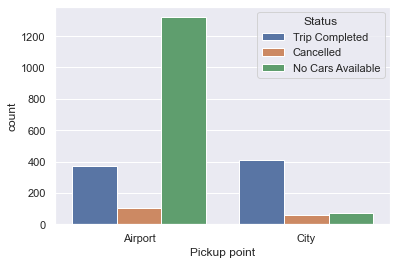

In [130]:
sns.countplot(x = 'Pickup point' , data =  df_eve_rush , hue = "Status")

#  Just Sample Analysis to understand data frame & how to add columns

In [147]:
df_2 =  pd.DataFrame(df['Time_slot'])

In [151]:
df_2 = df_2[df_2['Time_slot'] == "Day_Time"]
df_2

,Time_slot
0,Day_Time
11,Day_Time
14,Day_Time
16,Day_Time
18,Day_Time
20,Day_Time
21,Day_Time
27,Day_Time
28,Day_Time
31,Day_Time


In [167]:
df_4 = pd.DataFrame(columns = ['Time' , 'Pickup'])
df_4

,Time,Pickup


pandas.core.frame.DataFrame

In [173]:
df_4=  df[['Time_slot' , 'Pickup point']]
df_4

,Time_slot,Pickup point
0,Day_Time,Airport
1,Evening_Rush,Airport
2,Morning_Rush,City
3,Evening_Rush,Airport
4,Morning_Rush,City
5,Evening_Rush,Airport
6,Morning_Rush,Airport
7,Morning_Rush,Airport
8,Evening_Rush,City
9,Morning_Rush,City


In [176]:
df_4['req'] = df['req_hour'] + df['req_day']
df_4

<ipython-input-176-4071e937ddc1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_4['req'] = df['req_hour'] + df['req_day']


,Time_slot,Pickup point,req
0,Day_Time,Airport,22
1,Evening_Rush,Airport,28
2,Morning_Rush,City,21
3,Evening_Rush,Airport,33
4,Morning_Rush,City,21
5,Evening_Rush,Airport,34
6,Morning_Rush,Airport,20
7,Morning_Rush,Airport,20
8,Evening_Rush,City,32
9,Morning_Rush,City,17


#  Pie chart

In [189]:
dp = df.loc[(df['Pickup point'] == 'City') & (df["Time_slot"] == "Evening_Rush")]

In [190]:
ppd =  pd.DataFrame(dp['Status'].value_counts())

In [191]:
ppd

,Status
Trip Completed,411
No Cars Available,71
Cancelled,60


In [193]:
# Another way

a = df_eve_rush.loc[df_eve_rush['Pickup point'] == 'City']


In [194]:
b = pd.DataFrame(a['Status'].value_counts())

In [195]:
b

,Status
Trip Completed,411
No Cars Available,71
Cancelled,60


In [202]:
x = b['Status']
y = b['Status'].index
y

Index(['Trip Completed', 'No Cars Available', 'Cancelled'], dtype='object')

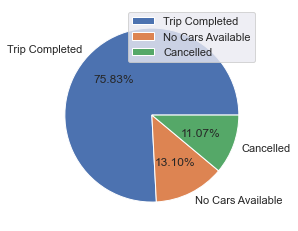

In [207]:
plt.pie( x , labels = y , autopct= "%0.2f%%")
plt.legend()
plt.show()